<img align="right" src="https://ds-cs-images.s3.ap-northeast-2.amazonaws.com/Codestates_Fulllogo_Color.png" width=100>

## *DATA SCIENCE / SECTION 2 / SPRINT 2 / NOTE 1*

# 📝 Assignment
---

# Decision Trees(결정트리)

## 캐글 인클래스(InClass) Competitions

### 1) EDA를 수행합시다

- [캐글 계정을 만드세요](https://www.kaggle.com/), 공유된 인클래스 대회 url을 통해 이동한 후 대회에 참여하세요.
- H1N1 데이터를 훈련/검증/테스트 셋으로 나누어 준비하세요
- profiling을 사용하여 데이터를 살펴보고, missing value, zeros, cardinarity 등을 확인하여 처리하세요.
- 본인만의 특성공학을 수행하세요.
- **(객관식) H1N1 분류기의 기준모델을 설정하세요. 기준모델의 정확도를 과제 제출폼에 제출하세요.**
    1. 0.24
    2. 0.50
    3. 0.76
    4. 1


In [1]:
!pip install kaggle
from google.colab import files
files.upload()

Saving submission.csv to submission (1).csv
Saving test.csv to test (1).csv
Saving train.csv to train (1).csv
Saving train_labels.csv to train_labels (1).csv


{'submission.csv': b'Id,vacc_h1n1_f\n0,0\n1,1\n2,1\n3,1\n4,0\n5,0\n6,0\n7,0\n8,1\n9,1\n10,0\n11,0\n12,0\n13,0\n14,1\n15,1\n16,1\n17,1\n18,1\n19,0\n20,1\n21,1\n22,0\n23,1\n24,0\n25,1\n26,1\n27,1\n28,0\n29,1\n30,1\n31,1\n32,1\n33,1\n34,0\n35,0\n36,1\n37,1\n38,1\n39,1\n40,1\n41,1\n42,0\n43,1\n44,0\n45,0\n46,1\n47,1\n48,0\n49,1\n50,0\n51,1\n52,1\n53,1\n54,1\n55,1\n56,1\n57,0\n58,1\n59,1\n60,0\n61,0\n62,0\n63,1\n64,1\n65,0\n66,1\n67,1\n68,1\n69,0\n70,0\n71,1\n72,0\n73,0\n74,0\n75,1\n76,0\n77,0\n78,1\n79,1\n80,1\n81,1\n82,1\n83,1\n84,0\n85,0\n86,0\n87,0\n88,1\n89,1\n90,0\n91,1\n92,1\n93,1\n94,0\n95,0\n96,0\n97,1\n98,0\n99,0\n100,1\n101,0\n102,0\n103,1\n104,0\n105,0\n106,0\n107,0\n108,1\n109,1\n110,1\n111,0\n112,1\n113,0\n114,0\n115,1\n116,0\n117,1\n118,1\n119,1\n120,1\n121,1\n122,0\n123,1\n124,1\n125,0\n126,0\n127,1\n128,0\n129,1\n130,0\n131,1\n132,1\n133,0\n134,0\n135,1\n136,1\n137,0\n138,0\n139,1\n140,0\n141,1\n142,1\n143,1\n144,1\n145,0\n146,0\n147,1\n148,0\n149,0\n150,1\n151,1\n152,1\n15

In [2]:
### 이곳에서 과제를 진행해 주세요 ###
import pandas as pd
from sklearn.model_selection import train_test_split

In [3]:
target = 'vacc_h1n1_f'
# target = 'vacc_seas_f'
train = pd.merge(pd.read_csv('train.csv'), 
                 pd.read_csv('train_labels.csv')[target], left_index=True, right_index=True)
test = pd.read_csv('test.csv')
sample_submission = pd.read_csv('submission.csv')

,Id,vacc_h1n1_f
0,0,0
1,1,1
2,2,1
3,3,1
4,4,0
...,...,...
28099,28099,0
28100,28100,1
28101,28101,1
28102,28102,0


In [17]:
train

,h1n1_concern,h1n1_knowledge,behavioral_antiviral_meds,behavioral_avoidance,behavioral_face_mask,behavioral_wash_hands,behavioral_large_gatherings,behavioral_outside_home,behavioral_touch_face,doctor_recc_h1n1,chronic_med_condition,child_under_6_months,health_insurance,health_worker,opinion_h1n1_vacc_effective,opinion_h1n1_risk,opinion_h1n1_sick_from_vacc,agegrp,education_comp,raceeth4_i,sex_i,inc_pov,marital,rent_own_r,census_region,census_msa,n_adult_r,household_children,n_people_r,hhs_region,vacc_h1n1_f,behaviorals
20365,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,NaN,0.0,Somewhat Effective,Somewhat Low,Not At All Worried,18 - 34 Years,4.0,3,1,1,2.0,1.0,1,"MSA, Not Principle City",4.0,0.0,4.0,2,0,0.0
29138,1.0,1.0,0.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,0.0,Somewhat Effective,Somewhat High,Not Very Worried,35 - 44 Years,2.0,3,2,3,2.0,2.0,2,Non-MSA,2.0,2.0,4.0,7,1,5.0
36128,2.0,2.0,0.0,1.0,0.0,1.0,1.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,Not Very Effective,Very Low,Dont Know,65+ Years,1.0,3,2,2,2.0,1.0,4,"MSA, Not Principle City",1.0,0.0,1.0,10,0,4.0
39793,2.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,Very Effective,Somewhat Low,Not Very Worried,55 - 64 Years,4.0,3,1,1,1.0,1.0,2,"MSA, Principle City",2.0,0.0,2.0,7,0,3.0
32973,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,0.0,Not At All Effective,Somewhat Low,Not At All Worried,18 - 34 Years,4.0,3,2,2,1.0,1.0,2,Non-MSA,2.0,3.0,5.0,7,0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8747,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,NaN,1.0,NaN,NaN,NaN,NaN,6 Months - 9 Years,NaN,3,1,4,NaN,1.0,2,"MSA, Not Principle City",4.0,1.0,5.0,5,0,0.0
4412,3.0,2.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,NaN,0.0,Not Very Effective,Somewhat High,Very Worried,55 - 64 Years,2.0,3,2,2,1.0,1.0,2,"MSA, Not Principle City",2.0,0.0,2.0,5,0,6.0
19064,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,6 Months - 9 Years,NaN,3,1,2,NaN,1.0,3,Non-MSA,2.0,1.0,3.0,4,0,0.0
40906,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,NaN,1.0,NaN,NaN,NaN,NaN,10 - 17 Years,NaN,3,1,1,NaN,1.0,4,Non-MSA,3.0,1.0,4.0,8,0,0.0


In [5]:
train, val = train_test_split(train, train_size=0.80, test_size=0.20, 
                              stratify=train[target], random_state=2)
train.shape, val.shape, test.shape

((33723, 39), (8431, 39), (28104, 38))

In [6]:
train[target].value_counts(normalize=True)

0    0.760935
1    0.239065
Name: vacc_h1n1_f, dtype: float64

In [7]:
from pandas_profiling import ProfileReport

profile = ProfileReport(train, minimal=True).to_notebook_iframe()

Summarize dataset:   0%|          | 0/48 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [8]:
train.T.duplicated()

h1n1_concern                   False
h1n1_knowledge                 False
behavioral_antiviral_meds      False
behavioral_avoidance           False
behavioral_face_mask           False
behavioral_wash_hands          False
behavioral_large_gatherings    False
behavioral_outside_home        False
behavioral_touch_face          False
doctor_recc_h1n1               False
doctor_recc_seasonal           False
chronic_med_condition          False
child_under_6_months           False
health_insurance               False
health_worker                  False
opinion_h1n1_vacc_effective    False
opinion_h1n1_risk              False
opinion_h1n1_sick_from_vacc    False
opinion_seas_vacc_effective    False
opinion_seas_risk              False
opinion_seas_sick_from_vacc    False
agegrp                         False
education_comp                 False
raceeth4_i                     False
sex_i                          False
inc_pov                        False
marital                        False
r

In [9]:
import numpy as np

def engineer(df):
    """특성을 엔지니어링 하는 함수입니다."""
    # 높은 카디널리티를 가지는 특성을 제거합니다.
    selected_cols = df.select_dtypes(include=['number', 'object'])
    labels = selected_cols.nunique() # 특성별 카디널리티 리스트
    selected_features = labels[labels <= 30].index.tolist() # 카디널리티가 30보다 작은 특성만 선택합니다.
    df = df[selected_features]
    
    # 새로운 특성을 생성합니다.
    behaviorals = [col for col in df.columns if 'behavioral' in col] 
    df['behaviorals'] = df[behaviorals].sum(axis=1)
    
    
    dels = [col for col in df.columns if ('employment' in col or 'seas' in col)]
    df.drop(columns=dels, inplace=True)
        
    return df


train = engineer(train)
val = engineer(val)
test = engineer(test)

In [34]:
train

,h1n1_concern,h1n1_knowledge,behavioral_antiviral_meds,behavioral_avoidance,behavioral_face_mask,behavioral_wash_hands,behavioral_large_gatherings,behavioral_outside_home,behavioral_touch_face,doctor_recc_h1n1,chronic_med_condition,child_under_6_months,health_insurance,health_worker,opinion_h1n1_vacc_effective,opinion_h1n1_risk,opinion_h1n1_sick_from_vacc,agegrp,education_comp,raceeth4_i,sex_i,inc_pov,marital,rent_own_r,census_region,census_msa,n_adult_r,household_children,n_people_r,hhs_region,vacc_h1n1_f,behaviorals
20365,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,NaN,0.0,Somewhat Effective,Somewhat Low,Not At All Worried,18 - 34 Years,4.0,3,1,1,2.0,1.0,1,"MSA, Not Principle City",4.0,0.0,4.0,2,0,0.0
29138,1.0,1.0,0.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,0.0,Somewhat Effective,Somewhat High,Not Very Worried,35 - 44 Years,2.0,3,2,3,2.0,2.0,2,Non-MSA,2.0,2.0,4.0,7,1,5.0
36128,2.0,2.0,0.0,1.0,0.0,1.0,1.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,Not Very Effective,Very Low,Dont Know,65+ Years,1.0,3,2,2,2.0,1.0,4,"MSA, Not Principle City",1.0,0.0,1.0,10,0,4.0
39793,2.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,Very Effective,Somewhat Low,Not Very Worried,55 - 64 Years,4.0,3,1,1,1.0,1.0,2,"MSA, Principle City",2.0,0.0,2.0,7,0,3.0
32973,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,0.0,Not At All Effective,Somewhat Low,Not At All Worried,18 - 34 Years,4.0,3,2,2,1.0,1.0,2,Non-MSA,2.0,3.0,5.0,7,0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8747,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,NaN,1.0,NaN,NaN,NaN,NaN,6 Months - 9 Years,NaN,3,1,4,NaN,1.0,2,"MSA, Not Principle City",4.0,1.0,5.0,5,0,0.0
4412,3.0,2.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,NaN,0.0,Not Very Effective,Somewhat High,Very Worried,55 - 64 Years,2.0,3,2,2,1.0,1.0,2,"MSA, Not Principle City",2.0,0.0,2.0,5,0,6.0
19064,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,6 Months - 9 Years,NaN,3,1,2,NaN,1.0,3,Non-MSA,2.0,1.0,3.0,4,0,0.0
40906,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,NaN,1.0,NaN,NaN,NaN,NaN,10 - 17 Years,NaN,3,1,1,NaN,1.0,4,Non-MSA,3.0,1.0,4.0,8,0,0.0


In [10]:

features = train.drop(columns=[target]).columns

In [11]:
X_train = train[features]
y_train = train[target]
X_val = val[features]
y_val = val[target]
X_test = test[features]

In [12]:
pip install --upgrade category_encoders

In [13]:
from category_encoders import OneHotEncoder
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.pipeline import make_pipeline

/usr/local/lib/python3.7/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [35]:
enc = OneHotEncoder()
imp_mean = SimpleImputer()
scaler = StandardScaler()
model_lr = LogisticRegression(n_jobs=-1)

X_train_encoded = enc.fit_transform(X_train)
X_train_imputed = imp_mean.fit_transform(X_train_encoded)
X_train_scaled = scaler.fit_transform(X_train_imputed)
model_lr.fit(X_train_scaled, y_train)

X_val_encoded = enc.transform(X_val)
X_val_imputed = imp_mean.transform(X_val_encoded)
X_val_scaled = scaler.transform(X_val_imputed)

# score method: Return the mean accuracy on the given test data and labels
print('검증세트 정확도', model_lr.score(X_val_scaled, y_val))

X_test_encoded = enc.transform(X_test)
X_test_imputed = imp_mean.transform(X_test_encoded)
X_test_scaled = scaler.transform(X_test_imputed)

y_pred = model_lr.predict(X_test_scaled)

/usr/local/lib/python3.7/dist-packages/category_encoders/utils.py:21: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  elif pd.api.types.is_categorical(cols):


검증세트 정확도 0.8185268651405527


In [55]:
len(y_pred)

28104

In [36]:
pipe = make_pipeline(
    OneHotEncoder(), 
    SimpleImputer(), 
    StandardScaler(), 
    LogisticRegression(n_jobs=-1)
)
pipe.fit(X_train, y_train)

print('검증세트 정확도', pipe.score(X_val, y_val))

y_pred = pipe.predict(X_test)

/usr/local/lib/python3.7/dist-packages/category_encoders/utils.py:21: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  elif pd.api.types.is_categorical(cols):


검증세트 정확도 0.8185268651405527


In [56]:
len(y_pred)

28104

In [32]:
pipe.named_steps

{'decisiontreeclassifier': DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='gini',
                        max_depth=6, max_features=None, max_leaf_nodes=None,
                        min_impurity_decrease=0.0, min_impurity_split=None,
                        min_samples_leaf=1, min_samples_split=2,
                        min_weight_fraction_leaf=0.0, presort='deprecated',
                        random_state=2, splitter='best'),
 'onehotencoder': OneHotEncoder(cols=['opinion_h1n1_vacc_effective', 'opinion_h1n1_risk',
                     'opinion_h1n1_sick_from_vacc', 'agegrp', 'census_msa'],
               drop_invariant=False, handle_missing='value',
               handle_unknown='value', return_df=True, use_cat_names=True,
               verbose=0),
 'simpleimputer': SimpleImputer(add_indicator=False, copy=True, fill_value=None,
               missing_values=nan, strategy='mean', verbose=0)}

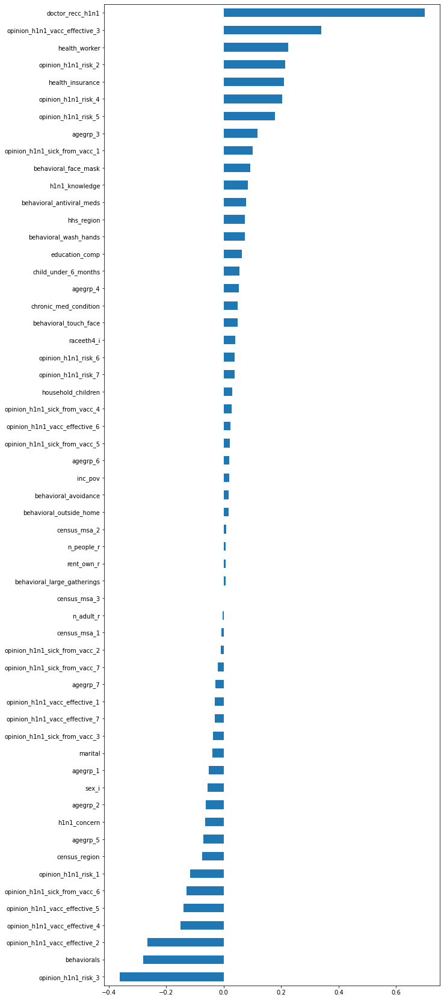

In [37]:
import matplotlib.pyplot as plt

model_lr = pipe.named_steps['logisticregression']
enc = pipe.named_steps['onehotencoder']
encoded_columns = enc.transform(X_val).columns
coefficients = pd.Series(model_lr.coef_[0], encoded_columns)
plt.figure(figsize=(10,30))
coefficients.sort_values().plot.barh();

In [20]:
from sklearn.tree import DecisionTreeClassifier

pipe = make_pipeline(
    OneHotEncoder(use_cat_names=True),  
    SimpleImputer(), 
    DecisionTreeClassifier(random_state=1, criterion='entropy')
)

pipe.fit(X_train, y_train)
print('훈련 정확도: ', pipe.score(X_train, y_train))
print('검증 정확도: ', pipe.score(X_val, y_val))

/usr/local/lib/python3.7/dist-packages/category_encoders/utils.py:21: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  elif pd.api.types.is_categorical(cols):


훈련 정확도:  0.9908667674880646
검증 정확도:  0.7572055509429486


### 2) 모델 개발
- 결정트리를 학습시킵니다. 하이퍼파라미터를 수정하여 성능을 높여보세요. 과적합을 주의하세요!
- 검증세트 스코어를 확인하세요.(평가지표는 F1-score입니다, 수식은 캐글 Overview-Evaluation 페이지를 확인해 주세요. 평가지표에 대한 내용은 다음에 자세히 배우고 활용할 것입니다 지금은 스코어를 올리기 위한 노력을 전혀 기울이지 말고 결정트리의 개념과 코드이해, 사용에 집중하세요!)
- 특성중요도를 그래프로 나타내 보세요
- **검증세트의 F1-score를 과제 제출폼에 제출하세요. (0.5 이상 통과)**

In [21]:
### 이곳에서 과제를 진행해 주세요 ###

pipe = make_pipeline(
    OneHotEncoder(use_cat_names=True), 
    SimpleImputer(), 
    DecisionTreeClassifier(min_samples_leaf=10, random_state=2)
)

pipe.fit(X_train, y_train)
print('훈련 정확도', pipe.score(X_train, y_train))
print('검증 정확도', pipe.score(X_val, y_val))

/usr/local/lib/python3.7/dist-packages/category_encoders/utils.py:21: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  elif pd.api.types.is_categorical(cols):


훈련 정확도 0.8577528689618361
검증 정확도 0.8029889692800379


In [44]:
pipe = make_pipeline(
    OneHotEncoder(use_cat_names=True), 
    SimpleImputer(), 
    DecisionTreeClassifier(max_depth=5, random_state=2)
)

pipe.fit(X_train, y_train)
print('훈련 정확도', pipe.score(X_train, y_train))
print('검증 정확도', pipe.score(X_val, y_val))

/usr/local/lib/python3.7/dist-packages/category_encoders/utils.py:21: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  elif pd.api.types.is_categorical(cols):


훈련 정확도 0.8237997805651929
검증 정확도 0.8232712608231526


In [26]:

model_dt = pipe.named_steps['decisiontreeclassifier']

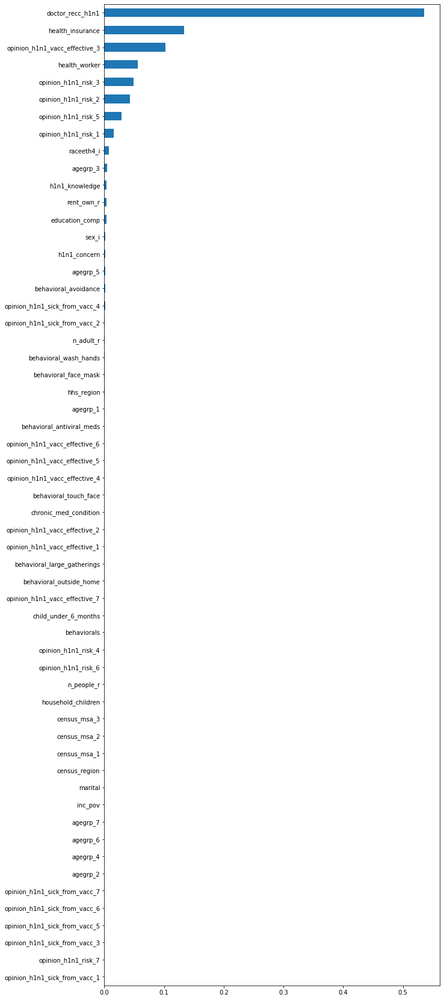

In [46]:
importances = pd.Series(model_dt.feature_importances_, encoded_columns)
plt.figure(figsize=(10,30))
importances.sort_values().plot.barh();

In [52]:
sample_submission=sample_submission.drop(['Id'], axis=1)
sample_submission

,vacc_h1n1_f
0,0
1,1
2,1
3,1
4,0
...,...
28099,0
28100,1
28101,1
28102,0


In [58]:
from sklearn.metrics import accuracy_score, recall_score, precision_score, f1_score

labels = sample_submission	
guesses = y_pred

print(accuracy_score(labels, guesses))	
print(recall_score(labels, guesses))
print(precision_score(labels, guesses))	
print(f1_score(labels, guesses))

0.5022060916595502
0.16852248394004282
0.5021267545725223
0.25235143223599826


### 3) 캐글 대회 참여

- 테스트셋에 대한 예측 결과를 캐글에 제출 하세요.(스코어가 많이 낮게 나와도 결정트리를 잘 이해하고 결과를 내었다면 충분합니다!)
- **캐글 Leaderboard의 본인 Score를 과제 제출폼에 제출하세요.**
 

## 🔥 도전과제

### 4) 다른 종류의 imputer를 사용하고 특성-타겟 관계 그래프를 나타내 보세요.
- 다른 종류의 imputer를 사용해 보세요([scikit-learn imputers](https://scikit-learn.org/stable/modules/impute.html))
- seaborn plots 사용하여 관심있는 특성들과 target간의 관계를 그래프로 나타내 보세요.
- [Seaborn "Categorical estimate" plots](https://seaborn.pydata.org/tutorial/categorical.html)
- [Seaborn linear model plots](https://seaborn.pydata.org/tutorial/regression.html)

In [16]:
### 이곳에서 과제를 진행해 주세요 ###